<center><img src="https://i.imgur.com/zRrFdsf.png" width="700"></center>



<a target="_blank" href="https://colab.research.google.com/github/CienciaDeDatosEspacial/GeoDataFrame_SpatialOperation/blob/main/GeoDF_Operations.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

# TAREA CALIFICADA - GEODATAFRAMES



# Exercise 1
<div class="alert-success">

1. Follow the same steps in this last section to plot three maps of one country. Do not use Brazil.
2. Plot your three layers.
    
</div>

In [ ]:
#importing useful libs
import geopandas as gpd
from  fiona import listlayers
import requests
import pandas as pd

In [ ]:
linkWorldMap="https://github.com/CienciaDeDatosEspacial/intro_geodataframe/raw/main/maps/worldMaps.gpkg"
listlayers(linkWorldMap)

['countries', 'rivers', 'cities', 'indicators']

In [ ]:
countries=gpd.read_file(linkWorldMap,layer='countries')

In [ ]:
denmark=countries[countries.COUNTRY=='Denmark']

In [ ]:
DenmarkBoundariesUrl="https://github.com/rubbims/Geodataframes/raw/main/maps/kontur_boundaries_DK_20230628.gpkg"
boundaries=gpd.read_file(DenmarkBoundariesUrl)

In [ ]:
DenmarkSeaportsUrl = "https://github.com/rubbims/Geodataframes/raw/main/maps/hotosm_dnk_sea_ports.gpkg"
seaports = gpd.read_file(DenmarkSeaportsUrl)

In [ ]:
DenmarkRailwaysUrl = "https://github.com/rubbims/Geodataframes/raw/main/maps/hotosm_dnk_railways.gpkg"
railways = gpd.read_file(DenmarkRailwaysUrl)

In [ ]:
DenmarkAirportsUrl = "https://github.com/rubbims/Geodataframes/raw/main/maps/hotosm_dnk_airports.gpkg"
airports=gpd.read_file(DenmarkAirportsUrl)

In [ ]:
boundaries_clipped = gpd.clip(gdf=boundaries,
                          mask=denmark)
seaports_clipped = gpd.clip(gdf=seaports,
                          mask=denmark)
railways_clipped = gpd.clip(gdf=railways,
                               mask=denmark)
airports_clipped = gpd.clip(gdf=airports,
                               mask=denmark)

<Axes: >

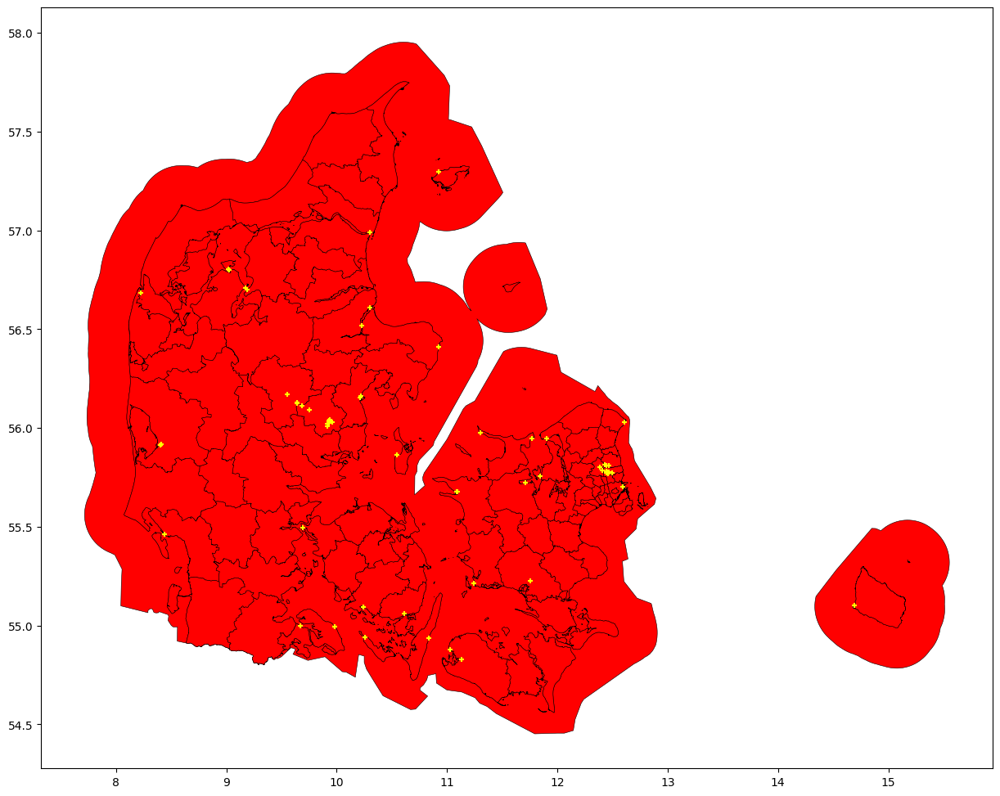

In [ ]:
#map of seaports
base = boundaries.plot(facecolor="red", edgecolor='black', linewidth=0.4,figsize=(15,15))
seaports_clipped.plot(marker='+', color='yellow', markersize=15,
                    ax=base)

<Axes: >

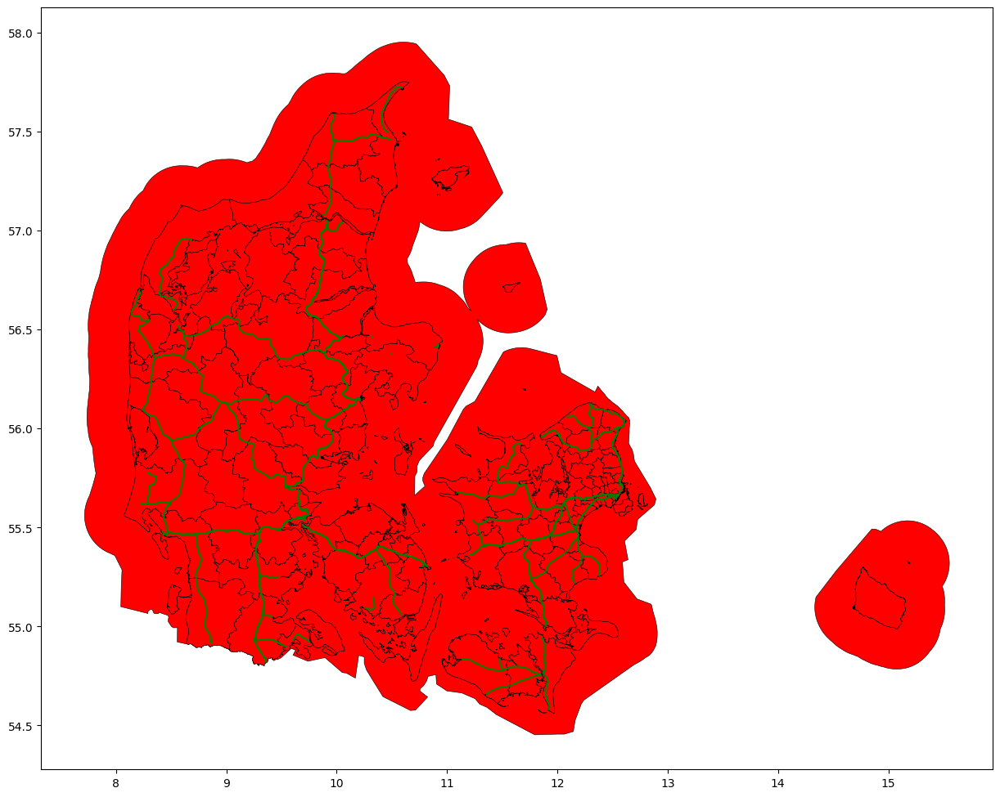

In [ ]:
#map of railways
base = boundaries.plot(facecolor="red", edgecolor='black', linewidth=0.4,figsize=(15,15))
railways_clipped.plot(marker='+', color='green', markersize=15,
                    ax=base)

<Axes: >

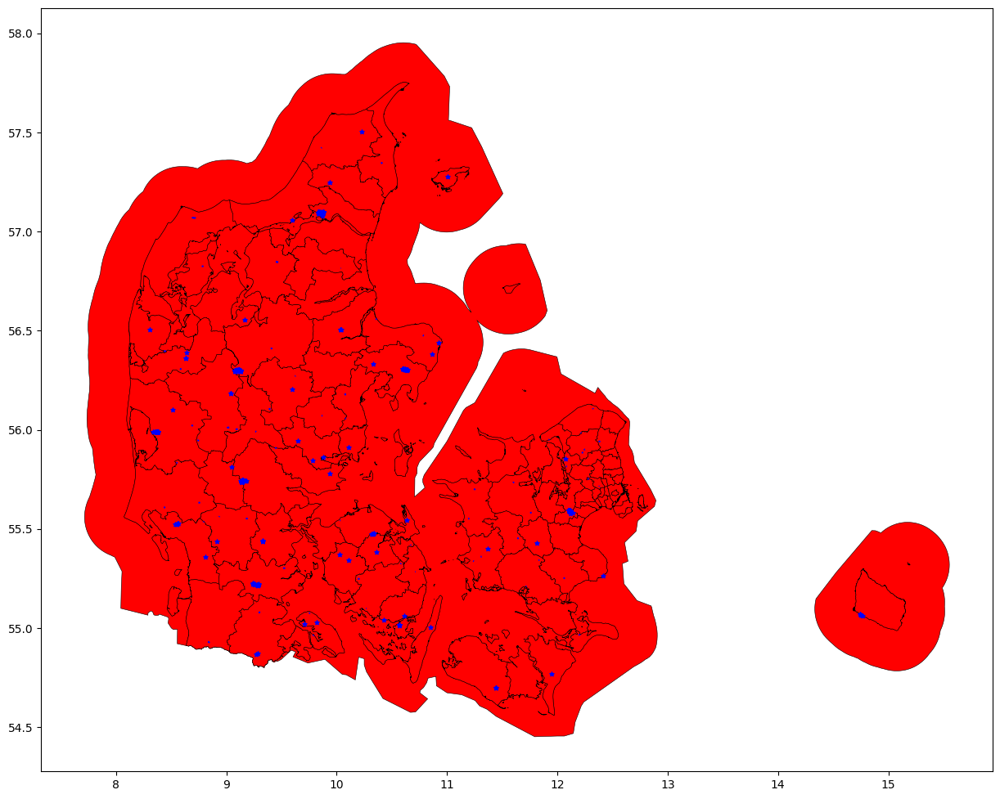

In [ ]:
#map of airports
base = boundaries.plot(facecolor="red", edgecolor='black', linewidth=0.4,figsize=(15,15))
airports_clipped.plot(marker='*', color='blue', markersize=15,
                    ax=base)

# Exercise 2
<div class="alert-success">

1. Reproject your country's map layers.
2. Plot the reprojected layers
3. Save the reprojected layers
    
</div>

In [ ]:
denmark.crs.is_projected

False

In [ ]:
denmark.centroid
#so, we need to re-project

<ipython-input-213-0eda7ecc094f>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  denmark.centroid


55    POINT (10.04630 55.96340)
dtype: geometry

In [ ]:
#we choose 4096 since its widely adpted in Europe
denmark.to_crs(4096).crs.axis_info

[Axis(name=Easting, abbrev=E, direction=east, unit_auth_code=EPSG, unit_code=9001, unit_name=metre),
 Axis(name=Northing, abbrev=N, direction=north, unit_auth_code=EPSG, unit_code=9001, unit_name=metre)]

In [ ]:
#true centroid
denmark.to_crs(4096).centroid

55    POINT (491579.011 1214846.509)
dtype: geometry

<Axes: >

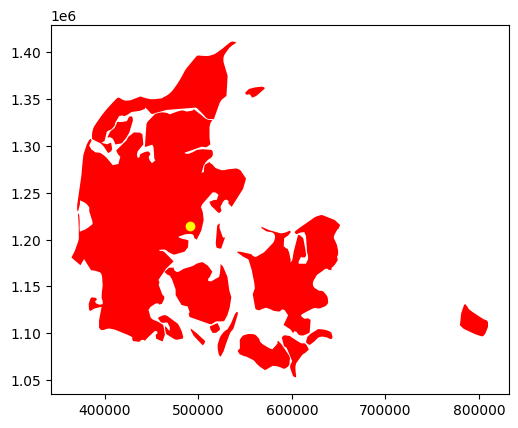

In [ ]:
#as we can see the centroid is on the projected map
base4096=denmark.to_crs(4096).plot(color='red')
denmark.to_crs(4096).centroid.plot(color='yellow',ax=base4096)

In [ ]:
#we commit the projected ver of each layer
denmark_4096=denmark.to_crs(4096)
seaports_denmark_4096=seaports_clipped.to_crs(denmark_4096.crs)
railways_denmark_4096=railways_clipped.to_crs(denmark_4096.crs)
airports_denmark_4096=airports_clipped.to_crs(denmark_4096.crs)

In [ ]:
airports_denmark_4096

,osm_id,capacity:persons,building,source,name,addr:full,aeroway,addr:city,emergency:helipad,operator:type,emergency,geometry
698,95461033,None,hangar,None,None,None,hangar,None,None,None,None,"POLYGON ((570896.174 1069316.719, 570909.428 1..."
2185,604537715,None,hangar,None,None,None,hangar,None,None,None,None,"POLYGON ((570850.801 1069324.406, 570864.055 1..."
2184,604537714,None,hangar,None,None,None,hangar,None,None,None,None,"POLYGON ((570834.737 1069327.117, 570847.991 1..."
2186,604537716,None,hangar,None,None,None,hangar,None,None,None,None,"POLYGON ((570781.861 1069336.144, 570797.333 1..."
1932,425969033,None,hangar,None,None,None,hangar,None,None,None,None,"POLYGON ((571191.467 1069330.179, 571209.290 1..."
...,...,...,...,...,...,...,...,...,...,...,...,...
1993,486028944,None,None,None,None,None,taxiway,None,None,None,None,"LINESTRING (514235.131 1386174.411, 514224.318..."
1057,119830058,None,yes,None,None,None,hangar,None,None,None,None,"POLYGON ((514187.039 1386194.191, 514186.980 1..."
1056,119830052,None,yes,None,Company Flight K/S,None,hangar,None,None,None,None,"POLYGON ((514127.373 1386207.119, 514126.993 1..."
1994,486028945,None,None,None,None,None,taxiway,None,None,None,None,"LINESTRING (514235.289 1386197.265, 514223.674..."


<Axes: >

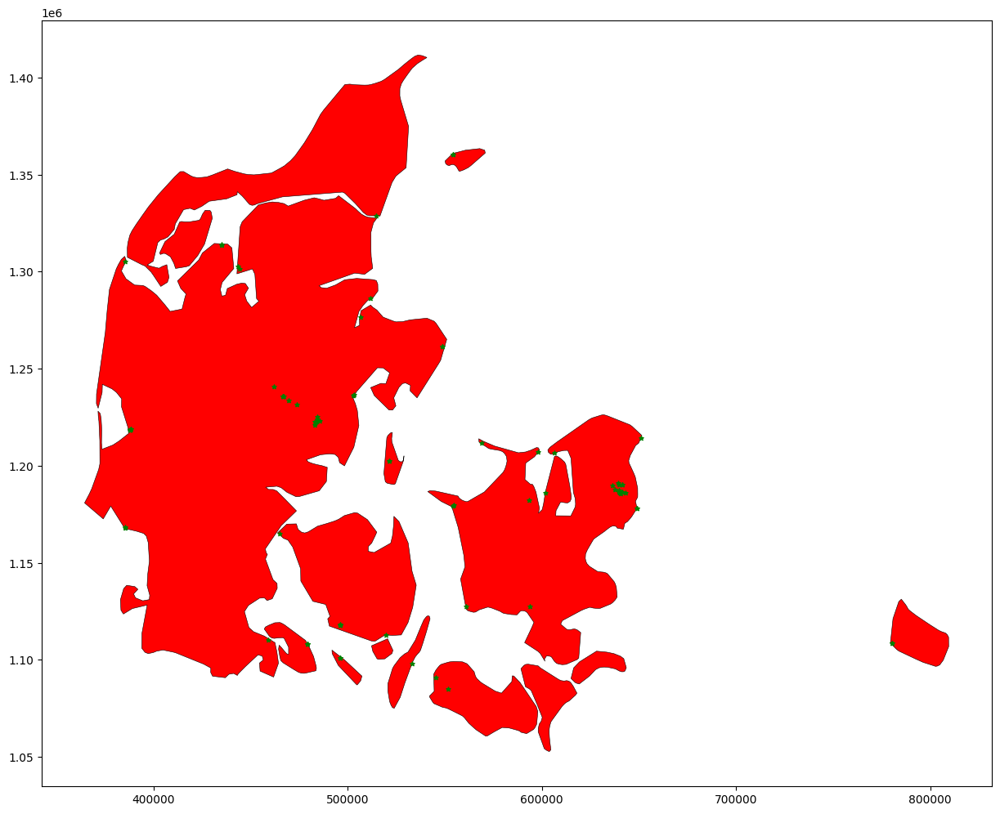

In [ ]:
#replotting seaports
base = denmark_4096.plot(facecolor="red", edgecolor='black', linewidth=0.4,figsize=(15,15))
seaports_denmark_4096.plot(marker='*', color='green', markersize=15,
                    ax=base)

<Axes: >

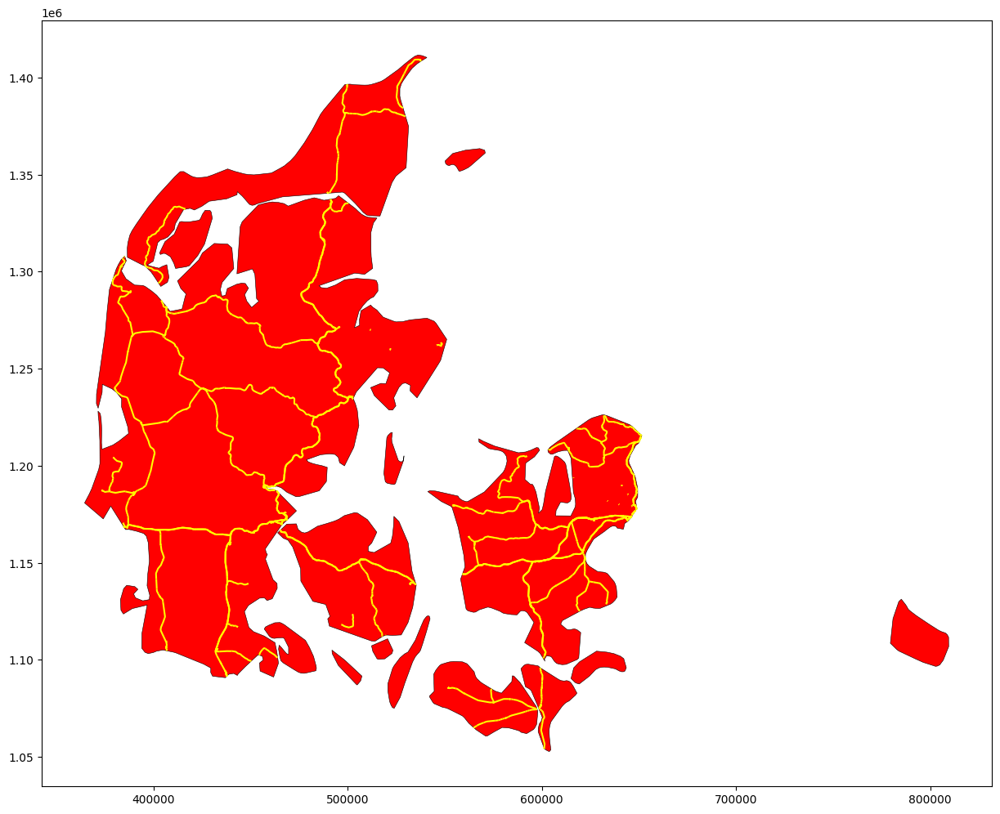

In [ ]:
#replotting railways
base = denmark_4096.plot(facecolor="red", edgecolor='black', linewidth=0.4,figsize=(15,15))
railways_denmark_4096.plot(marker='.', color='yellow', markersize=15,
                    ax=base)

<Axes: >

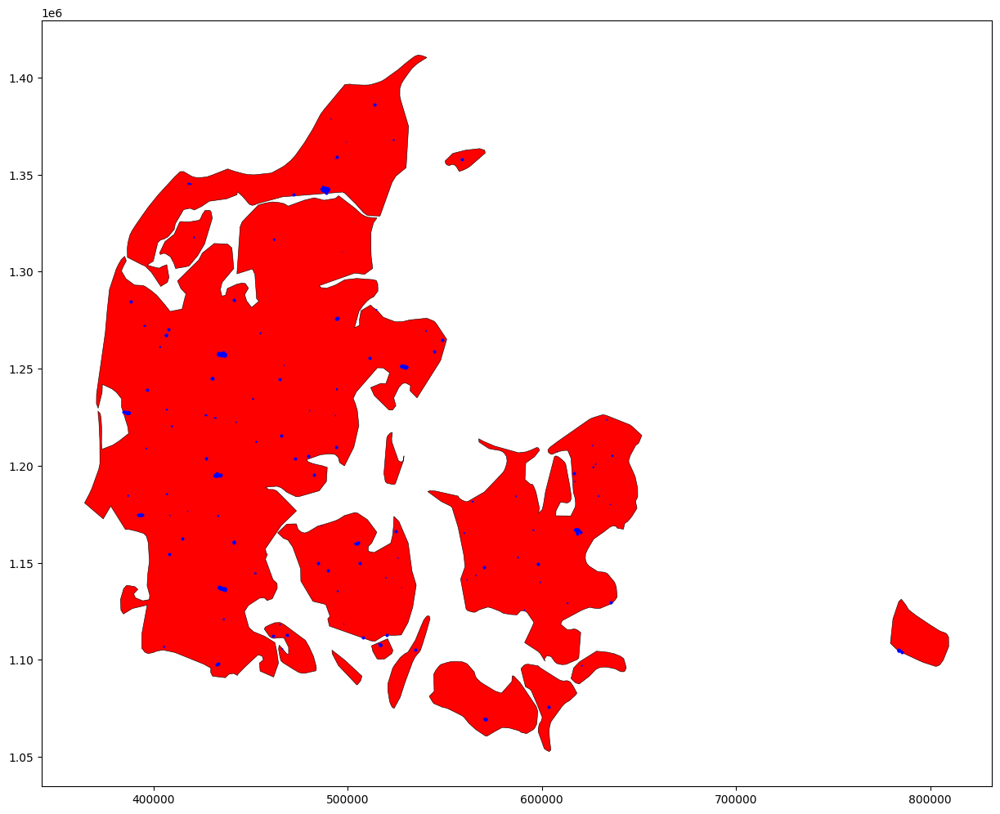

In [ ]:
#replotting airports
base = denmark_4096.plot(facecolor="red", edgecolor='black', linewidth=0.4,figsize=(15,15))
airports_denmark_4096.plot(marker='.', color='blue', markersize=15,
                    ax=base)

In [ ]:
#lets save the projected ver of each layer into gpkg
denmark_4096.to_file("denmark4096.gpkg", driver="GPKG")
seaports_denmark_4096.to_file("seaports4096.gpkg", driver="GPKG")
railways_denmark_4096.to_file("railways4096.gpkg", driver="GPKG")
airports_denmark_4096.to_file("airports4096.gpkg", driver="GPKG")

# Exercise 3
<div class="alert-success">

1. Find the airports for your country [here](https://ourairports.com/data/). The data is in a CSV file.
2. Create projected layer of airports.
3. Plot all the layers and airports on top.
    
</div>

In [ ]:
import pandas as pd

In [ ]:
#reading denmark airports csv
airports_url = "https://github.com/rubbims/Geodataframes/raw/main/data/dk-airports.csv"
dm_airports = pd.read_csv(airports_url)
# some rows
dm_airports.head()

,id,ident,type,name,latitude_deg,longitude_deg,elevation_ft,continent,country_name,iso_country,region_name,iso_region,local_region,municipality,scheduled_service,gps_code,iata_code,local_code,home_link,wikipedia_link,keywords,score,last_updated
0,2542,EKCH,large_airport,Copenhagen Kastrup Airport,55.617901,12.656000,17.0,EU,Denmark,DK,Capital Region,DK-84,84,Copenhagen,1,EKCH,CPH,NaN,http://www.cph.dk/en/,https://en.wikipedia.org/wiki/Copenhagen_Airport,"København, Malmö",1020075,2015-09-19T15:12:02+00:00
1,2541,EKBI,large_airport,Billund Airport,55.740496,9.160452,247.0,EU,Denmark,DK,South Denmark,DK-83,83,Billund,1,EKBI,BLL,NaN,http://www.billund-airport.dk/?sc_lang=en,https://en.wikipedia.org/wiki/Billund_Airport,NaN,1275,2023-12-04T15:48:16+00:00
2,2562,EKYT,medium_airport,Aalborg Airport,57.094763,9.849930,10.0,EU,Denmark,DK,North Jutland,DK-81,81,Aalborg,1,EKYT,AAL,NaN,http://www.aal.dk,https://en.wikipedia.org/wiki/Aalborg_Airport,NaN,750,2023-12-04T15:44:41+00:00
3,2540,EKAH,medium_airport,Aarhus Airport,56.303331,10.618286,82.0,EU,Denmark,DK,Central Jutland,DK-82,82,Aarhus,1,EKAH,AAR,NaN,http://www.aar.dk/default.asp?id=87,https://en.wikipedia.org/wiki/Aarhus_Airport,NaN,750,2021-10-06T16:42:48+00:00
4,2551,EKRK,medium_airport,Copenhagen Roskilde Airport,55.585602,12.131400,146.0,EU,Denmark,DK,Zealand,DK-85,85,Copenhagen,1,EKRK,RKE,NaN,NaN,https://en.wikipedia.org/wiki/Roskilde_Airport,København,575,2024-04-06T20:51:02+00:00


In [ ]:
#we keep the same columns as the example
keep=['name','type','latitude_deg', 'longitude_deg','elevation_ft','region_name','municipality']
dm_airports=dm_airports.loc[:,keep]
dm_airports.info()
#latitude,longitude and elevation are already numeric

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 138 entries, 0 to 137
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           138 non-null    object 
 1   type           138 non-null    object 
 2   latitude_deg   138 non-null    float64
 3   longitude_deg  138 non-null    float64
 4   elevation_ft   59 non-null     float64
 5   region_name    138 non-null    object 
 6   municipality   95 non-null     object 
dtypes: float64(3), object(4)
memory usage: 7.7+ KB


In [ ]:
#Reserved names must not be used, lets rename type
dm_airports.rename(columns={'type':'kind'},inplace=True)
dm_airports.head()

,name,kind,latitude_deg,longitude_deg,elevation_ft,region_name,municipality
0,Copenhagen Kastrup Airport,large_airport,55.617901,12.656000,17.0,Capital Region,Copenhagen
1,Billund Airport,large_airport,55.740496,9.160452,247.0,South Denmark,Billund
2,Aalborg Airport,medium_airport,57.094763,9.849930,10.0,North Jutland,Aalborg
3,Aarhus Airport,medium_airport,56.303331,10.618286,82.0,Central Jutland,Aarhus
4,Copenhagen Roskilde Airport,medium_airport,55.585602,12.131400,146.0,Zealand,Copenhagen


In [ ]:
#lets reproject all layer including new one
#we use 25832 since is commonly used in the north of europe
airportscsv=airports.to_crs(25832)
denmark_25832=denmark_4096.to_crs(25832)
seaports_denmark_25832=seaports_denmark_4096.to_crs(denmark_25832.crs)
railways_denmark_25832=railways_denmark_4096.to_crs(denmark_25832.crs)
airports_denmark_25832=airports_denmark_4096.to_crs(denmark_25832.crs)

<Axes: >

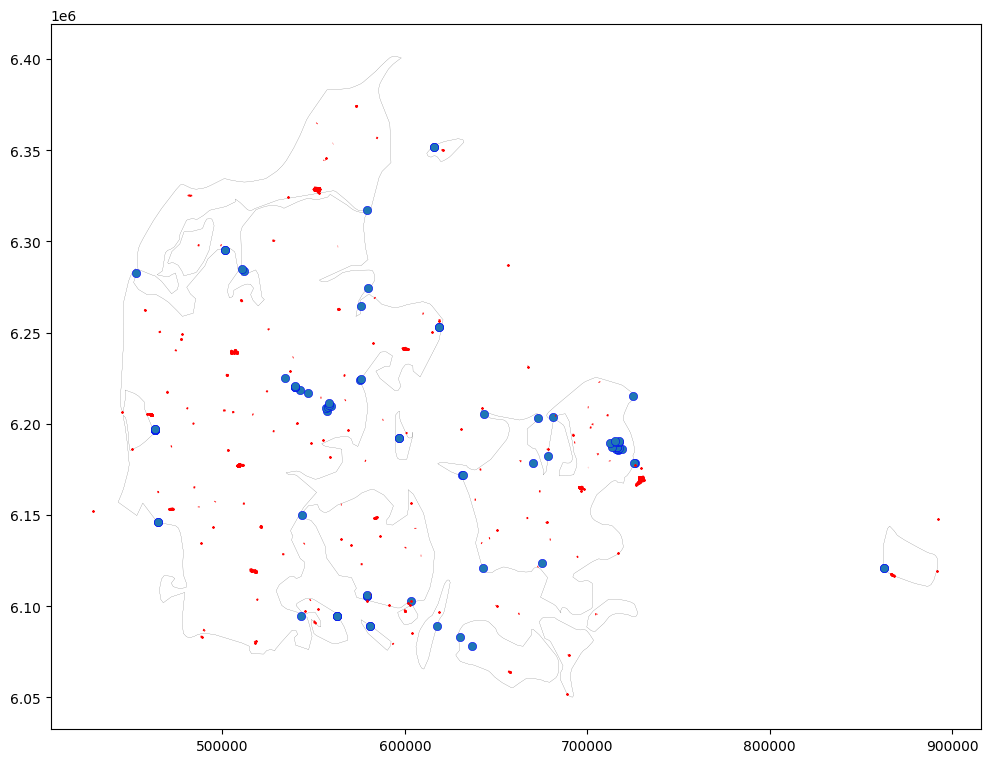

In [ ]:
#replotting seaports w airportscsv on top
base = denmark_25832.plot(facecolor="white",
                      edgecolor='black',
                      linewidth=0.1,
                      figsize=(12,12))
seaports_denmark_25832.plot(edgecolor='blue', linewidth=0.4,
            ax=base)
airportscsv.plot(marker='*', color='red', markersize=1,alpha=1,
            ax=base)

<Axes: >

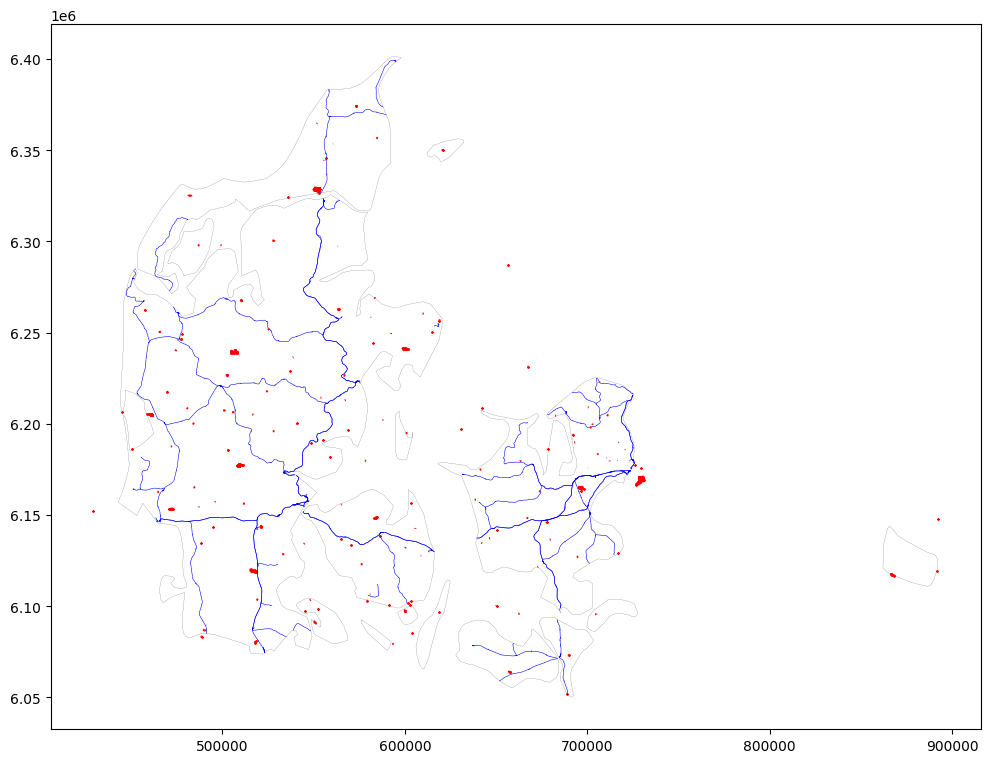

In [ ]:
#replotting railways w airportscsv on top
base = denmark_25832.plot(facecolor="white",
                      edgecolor='black',
                      linewidth=0.1,
                      figsize=(12,12))
railways_denmark_25832.plot(edgecolor='blue', linewidth=0.4,
            ax=base)
airportscsv.plot(marker='*', color='red', markersize=1,alpha=1,
            ax=base)

<Axes: >

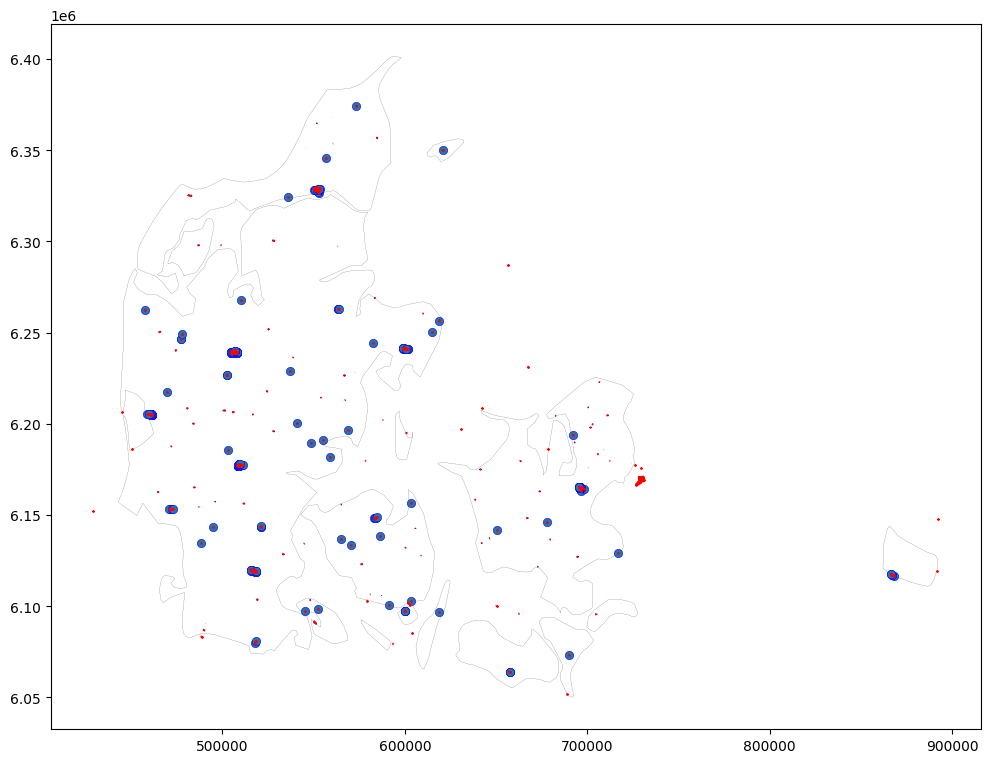

In [ ]:
#replotting airports w airportscsv on top
base = denmark_25832.plot(facecolor="white",
                      edgecolor='black',
                      linewidth=0.1,
                      figsize=(12,12))
airports_denmark_25832.plot(edgecolor='blue', linewidth=0.4,
            ax=base)
airportscsv.plot(marker='*', color='red', markersize=1,alpha=1,
            ax=base)
#airportscsv has more info than our layer

# Exercise 4

<div class="alert-success">
    
1. Check if your country is a polygon or multipolygon.
    
2. Recover just the boundaries of that country.
    
3. Turn the boundary into a GDF.
</div>

In [ ]:
denmark_25832
#is a multipolygon

,COUNTRY,geometry
55,Denmark,"MULTIPOLYGON (((464205.349 6281709.969, 465896..."


<Axes: >

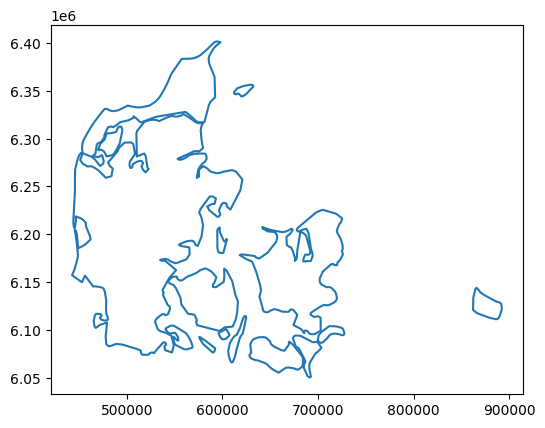

In [ ]:
# Getting the border lines from denmark25832
denmark_25832.boundary.plot()

In [ ]:
type(denmark_25832.boundary)
#we got geoseries

geopandas.geoseries.GeoSeries

In [ ]:
#lets transform it to geodf
denmark_25832.boundary.to_frame()

,0
55,"MULTILINESTRING ((464205.349 6281709.969, 4658..."


In [ ]:
#lets transform it to geodf
borderdm=denmark_25832.boundary.to_frame()
#name of country
borderdm['name']='Denmark'
#renaming geometry column
borderdm.rename(columns={0:'geometry'},inplace=True)
#setting geometry columns
borderdm = borderdm.set_geometry("geometry")
# verifying:
borderdm

,geometry,name
55,"MULTILINESTRING ((464205.349 6281709.969, 4658...",Denmark


### Exercise 5 (conditional)

<div class="alert-success">

1. Look for sub administrative divisions of your country
</div>

In [ ]:
# https://data.humdata.org/dataset/whosonfirst-data-admin-dnk

#from google.colab import drive
#drive.mount('/content/drive')

# URLs correctas a los archivos raw en GitHub
denmark_states_url = "https://raw.githubusercontent.com/rubbims/Geodataframes/main/maps/whosonfirst-data-admin-dk-latest/whosonfirst-data-admin-dk-region-polygon.shp"
denmark_municipalities_url = "https://raw.githubusercontent.com/rubbims/Geodataframes/main/maps/whosonfirst-data-admin-dk-latest/whosonfirst-data-admin-dk-localadmin-polygon.shp"

# Lee los archivos directamente desde las URLs
denmark_states = gpd.read_file(denmark_states_url)
denmark_municipalities = gpd.read_file(denmark_municipalities_url)

<Axes: >

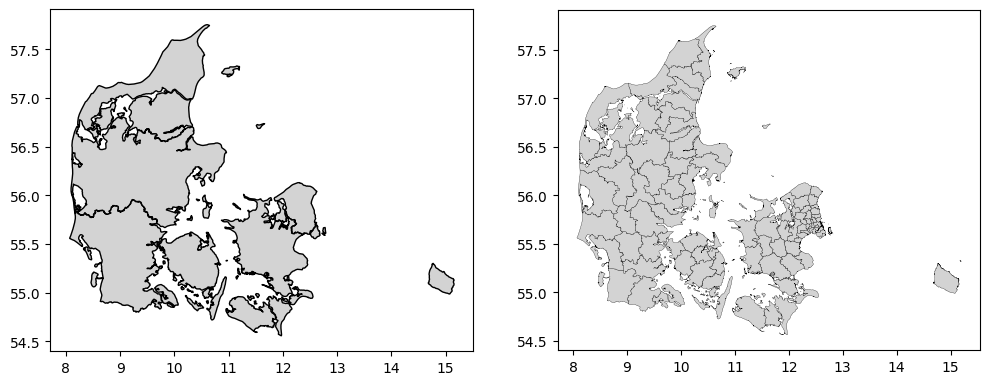

In [ ]:
from matplotlib import pyplot as plt
fig, (ax1, ax2) = plt.subplots(ncols=2, sharex=False, sharey=False, figsize=(12,12))

denmark_states.cx[0:,:].plot(ax=ax1, facecolor='lightgrey', edgecolor='black')
denmark_municipalities.plot(ax=ax2, facecolor='lightgrey', edgecolor='black',linewidth=0.2)

2. Check all the CRSs of those divisions

In [ ]:
print(type(denmark_states), type(denmark_municipalities)) #vemos que es un gdf
print(denmark_states.geometry.head()) # es multipoligonal
print(denmark_states.crs, denmark_municipalities.crs) # sí tiene crs

<class 'geopandas.geodataframe.GeoDataFrame'> <class 'geopandas.geodataframe.GeoDataFrame'>
0    MULTIPOLYGON (((-6.91145 61.62627, -6.89056 61...
1    MULTIPOLYGON (((8.40776 55.45601, 8.40627 55.4...
2    MULTIPOLYGON (((14.70088 55.14588, 14.69875 55...
3    MULTIPOLYGON (((10.98130 54.83016, 10.97817 54...
4    MULTIPOLYGON (((11.02050 57.24190, 11.06478 57...
Name: geometry, dtype: geometry
EPSG:4326 EPSG:4326


In [ ]:
print(denmark_states.crs.axis_info, '\n', denmark_municipalities.crs.axis_info) # ESTÁ EN POLARES, DEBEMOS TRANSFORMAR LUEGO A METROS
print(denmark_states.crs, denmark_municipalities.crs) # sí tiene crs

[Axis(name=Geodetic latitude, abbrev=Lat, direction=north, unit_auth_code=EPSG, unit_code=9122, unit_name=degree), Axis(name=Geodetic longitude, abbrev=Lon, direction=east, unit_auth_code=EPSG, unit_code=9122, unit_name=degree)] 
 [Axis(name=Geodetic latitude, abbrev=Lat, direction=north, unit_auth_code=EPSG, unit_code=9122, unit_name=degree), Axis(name=Geodetic longitude, abbrev=Lon, direction=east, unit_auth_code=EPSG, unit_code=9122, unit_name=degree)]
EPSG:4326 EPSG:4326


In [ ]:
denmark = countries[countries.COUNTRY=='Dinamarca']
denmark.crs #4326

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

3. If you find one CRS is missing, fill the CRS with the right projection.

In [ ]:
# ya tienen su CRS, lo que nos falta es hacer la correcta proyección a un crs favorable

# tomamos "FEH2010 / Fehmarnbelt TM" con "EPSG:5596"

denmark_states = denmark_states.to_crs(5596)
denmark_municipalities = denmark_municipalities.to_crs(5596)

## Exercise 6


<div class="alert-success">
1. Create some subset of polygons with your country data.

In [ ]:
denmark_municipalities.plot(ax=ax2, facecolor='lightgrey', edgecolor='black',linewidth=0.2)

<Axes: >

<Figure size 640x480 with 0 Axes>

In [ ]:
pd.set_option('display.max_columns', None)
denmark_municipalities.head(10)

,id,parent_id,name,placetype,placelocal,country,repo,lat,lon,min_lat,min_lon,max_lat,max_lon,min_zoom,max_zoom,min_label,max_label,modified,is_funky,population,country_id,region_id,county_id,concord_ke,concord_id,iso_code,hasc_id,gn_id,wd_id,name_ara,name_ben,name_deu,name_eng,name_ell,name_fas,name_fra,name_heb,name_hin,name_hun,name_ind,name_ita,name_jpn,name_kor,name_nld,name_pol,name_por,name_rus,name_spa,name_swe,name_tur,name_ukr,name_urd,name_vie,name_zho,geom_src,geometry
0,1159297717,85682589,Holbaek,localadmin,kommune,DK,whosonfirst-data-admin-dk,55.675774,11.573848,55.508929,11.350962,55.809169,11.858369,12,None,13.5,18,2023-09-28,None,71541,85633121,85682589,None,dk-geodk:code,316,None,None,None,None,None,None,None,Holbaek,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,dk-geodk,"MULTIPOLYGON (((1028605.296 6171633.116, 10286..."
1,1159297719,85682589,Stevns,localadmin,kommune,DK,whosonfirst-data-admin-dk,55.326944,12.334101,55.235697,12.107425,55.427477,12.456528,12,None,13.5,18,2023-09-28,None,22805,85633121,85682589,None,dk-geodk:code,336,None,None,None,None,None,None,None,Stevns,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,dk-geodk,"MULTIPOLYGON (((1071296.650 6133778.538, 10712..."
2,1159297721,85682597,Skanderborg,localadmin,kommune,DK,whosonfirst-data-admin-dk,56.076149,9.872121,55.953987,9.633145,56.216936,10.092933,12,None,13.5,18,2023-09-28,None,62678,85633121,85682597,None,dk-geodk:code,746,None,None,None,None,None,None,Skanderborg,Skanderborg,None,None,Skanderborg,None,None,None,None,Skanderborg,None,None,Skanderborg,Skanderborg,Skanderborg,Сканнерборг,Skanderborg,Skanderborg,None,None,None,None,斯坎訥堡自治市,dk-geodk,"POLYGON ((894560.919 6217046.948, 894711.815 6..."
3,1159297723,85682581,Lyngby-Taarbaek,localadmin,kommune,DK,whosonfirst-data-admin-dk,55.781735,12.510815,55.759558,12.413286,55.809710,12.596912,12,None,13.5,18,2023-09-28,None,56214,85633121,85682581,None,dk-geodk:code,173,None,None,None,None,None,None,None,Lyngby-Taarbaek,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,dk-geodk,"POLYGON ((1078317.333 6187878.034, 1078327.597..."
4,1159297725,85682597,Herning,localadmin,kommune,DK,whosonfirst-data-admin-dk,56.203869,8.933449,55.879568,8.433759,56.414040,9.187847,12,None,13.5,18,2023-09-28,None,89127,85633121,85682597,None,dk-geodk:code,657,None,None,None,None,هرنينغ,None,Herning,Herning,None,هرنینگ,Herning,None,None,None,Munisipalitas Herning,Herning,ヘアニング,헤르닝,Herning,Herning,None,Хернинг,Herning,Herning,Herning,Гернінг,None,Herning,海宁,dk-geodk,"MULTIPOLYGON (((832268.655 6226344.658, 832274..."
5,1159297727,85682581,Copenhagen,localadmin,kommune,DK,whosonfirst-data-admin-dk,55.698354,12.571489,55.612853,12.452998,55.732711,12.734255,12,None,13.5,18,2023-09-28,None,632340,85633121,85682581,None,dk-geodk:code,101,None,None,None,None,كوبنهاغن,কোপেনহেগেন,Kopenhagen,Copenhagen,Κοπεγχάγη,کپنهاگ,Copenhague,קופנהגן,कोपनहेगन,Koppenhága,Kopenhagen,Copenaghen,コペンハーゲン,코펜하겐,Kopenhagen,Kopenhaga,Copenhaga,Копенгаген,Copenhague,Köpenhamn,Kopenhag,Копенгаген,کوپن ہیگن,Copenhagen,哥本哈根,dk-geodk,"MULTIPOLYGON (((1088066.280 6176427.948, 10880..."
6,1159297729,85682581,Frederikssund,localadmin,kommune,DK,whosonfirst-data-admin-dk,55.793708,11.985618,55.714237,11.845962,55.937969,12.231291,12,None,13.5,18,2023-09-28,None,45223,85633121,85682581,None,dk-geodk:code,250,None,None,None,None,None,None,Frederikssund,Frederikssund,None,None,None,None,None,Frederikssund,None,None,None,None,Frederikssund,Frederikssund,None,Фредерикссунн,Frederikssund,Frederikssund,None,None,None,None,None,dk-geodk,"MULTIPOLYGON (((1043096.801 6177341.505, 10430..."
7,1159297733,85682581,Albertslund,localadmin,kommune,DK,whosonfirst-data-admin-dk,55.679988,12.347031,55.641959,12.311000,55.709789,12.396280,12,None,13.5,18,2023-09-28,None,27731,85633121,85682581,None,dk

In [ ]:
denmark_municipalities['parent_id'].value_counts() # a qué región pertenece cada localidad

parent_id
 85682581    29
 85682575    22
 85682597    19
 85682589    17
 85682593    11
-1            1
Name: count, dtype: int64

<Axes: >

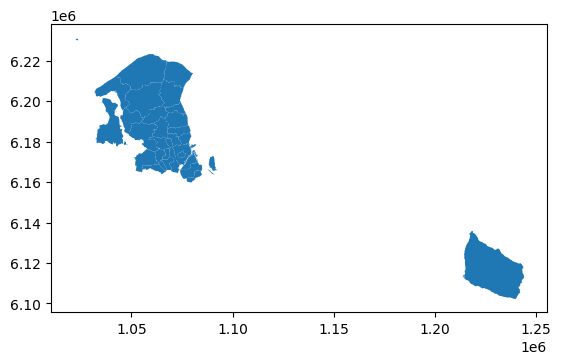

In [ ]:
denmark_municipalities[denmark_municipalities['parent_id']==85682581].plot()

2. Use Unary UNION with those  polygons.

In [ ]:
parent_id_union=denmark_municipalities[denmark_municipalities['parent_id']==85682581].unary_union
parent_id_union

3. Create a geoDF with the result.

In [ ]:
parentGDF = gpd.GeoDataFrame(index=[0],data={'parent_id':85682581},
                 crs=denmark_municipalities.crs,
                 geometry=[parent_id_union])
parentGDF

,parent_id,geometry
0,85682581,"MULTIPOLYGON (((1042974.632 6177385.131, 10429..."


4. Use dissolve with the same polygons, and create a geoDF.

,geometry,id,name,placetype,placelocal,country,repo,lat,lon,min_lat,min_lon,max_lat,max_lon,min_zoom,max_zoom,min_label,max_label,modified,is_funky,population,country_id,region_id,county_id,concord_ke,concord_id,iso_code,hasc_id,gn_id,wd_id,name_ara,name_ben,name_deu,name_eng,name_ell,name_fas,name_fra,name_heb,name_hin,name_hun,name_ind,name_ita,name_jpn,name_kor,name_nld,name_pol,name_por,name_rus,name_spa,name_swe,name_tur,name_ukr,name_urd,name_vie,name_zho,geom_src
parent_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
-1,"MULTIPOLYGON (((1244246.738 6139688.235, 12442...",1394014155,Christianso,localadmin,kommune,DK,whosonfirst-data-admin-dk,55.320402,15.188798,55.317257,15.173827,55.330772,15.197400,12,None,13.5,18,2023-09-28,None,84,-1,-1,None,dk-geodk:code,411,None,None,None,None,None,None,None,Christianso,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,dk-geodk
85682575,"MULTIPOLYGON (((882439.770 6083032.984, 882441...",1159297747,Haderslev,localadmin,kommune,DK,whosonfirst-data-admin-dk,55.232202,9.374950,55.125549,8.884642,55.382343,9.778885,12,None,13.5,18,2023-09-28,None,55670,85633121,85682575,None,dk-geodk:code,510,None,None,None,None,أودنسه,সভেন্ডবোর্গ,Haderslev,Haderslev,Λάνγκελαντ,ادنسه,Kerteminde,אודנסה,ओडिन्से,Vejen,Langeland,Haderslev,ランゲラン島,하데르슬레우,Haderslev,Haderslev,Haderslev,Хадерслев,Haderslev,Haderslev,Haderslev,Гадерслев,اودنسے,Langeland,凯特明讷,dk-geodk
85682581,"MULTIPOLYGON (((1042974.632 6177385.131, 10429...",1159297723,Lyngby-Taarbaek,localadmin,kommune,DK,whosonfirst-data-admin-dk,55.781735,12.510815,55.759558,12.413286,55.809710,12.596912,12,None,13.5,18,2023-09-28,None,56214,85633121,85682581,None,dk-geodk:code,173,None,None,None,None,كوبنهاغن,কোপেনহেগেন,Kopenhagen,Lyngby-Taarbaek,Κοπεγχάγη,کپنهاگ,Copenhague,קופנהגן,कोपनहेगन,Koppenhága,Kopenhagen,Copenaghen,コペンハーゲン,코펜하겐,Kopenhagen,Kopenhaga,Copenhaga,Копенгаген,Copenhague,Köpenhamn,Kopenhag,Копенгаген,کوپن ہیگن,Copenhagen,哥本哈根,dk-geodk
85682589,"MULTIPOLYGON (((976998.632 6074588.187, 977002...",1159297717,Holbaek,localadmin,kommune,DK,whosonfirst-data-admin-dk,55.675774,11.573848,55.508929,11.350962,55.809169,11.858369,12,None,13.5,18,2023-09-28,None,71541,85633121,85682589,None,dk-geodk:code,316,None,None,None,None,لولاند,রসক্লাইড,Guldborgsund,Holbaek,Λόλλαντ,لولند,Guldborgsund,ליירה,रोसकिल्ड,Slagelse,Lolland,Slagelse,グルドボースンド海峡,슬라겔세,Guldborg Sund,Slagelse,Slagelse,Слагельсе,Guldborgsund,Guldborg Sund,Roskilde,Слагельсе,راسکیلے,Slagelse,古爾德堡海峽,dk-geodk
85682593,"MULTIPOLYGON (((834510.776 6287190.389, 834508...",1159297741,Vesthimmerland,localadmin,kommune,DK,whosonfirst-data-admin-dk,56.813064,9.364557,56.636899,9.068354,57.030598,9.659873,12,None,13.5,18,2023-09-28,None,36727,85633121,85682593,None,dk-geodk:code,820,None,None,None,None,آلبورغ,ফ্রেডেরিকশাভন,Aalborg,Vesthimmerland,Άλμποργκ,آلبورگ,Aalborg,אולבורג,फ़्रेडेरिकशॉन,Aalborg,Aalborg,Aalborg,オールボー,올보르,Aalborg,Aalborg,Aalborg,Ольборг,Aalborg,Ålborg,Aalborg,Ольборг,آلبو,Aalborg,奥尔堡,dk-geodk
85682597,"MULTIPOLYGON (((802338.295 6194475.607, 802338...",1159297721,Skanderborg,localadmin,kommune,DK,whosonfirst-data-admin-dk,56.076149,9.872121,55.953987,9.633145,56.216936,10.092933,12,None,13.5,18,2023-09-28,None,62678,85633121,85682597,None,dk-geodk:code,746,None,None,None,None,هرنينغ,ভিবর্গ,Skanderborg,Skanderborg,Ράντερς,هرنینگ,Skanderborg,אורהוס,वाइबोर्ग,Randers,Munisipalitas Herning,Skanderborg,ヘアニング,헤르닝,Skanderborg,Skanderborg,Skanderborg,Сканнерборг,Skanderborg,Skanderborg,Herning,Гернінг,آرہس,Herning,斯坎訥堡自治市,dk-geodk


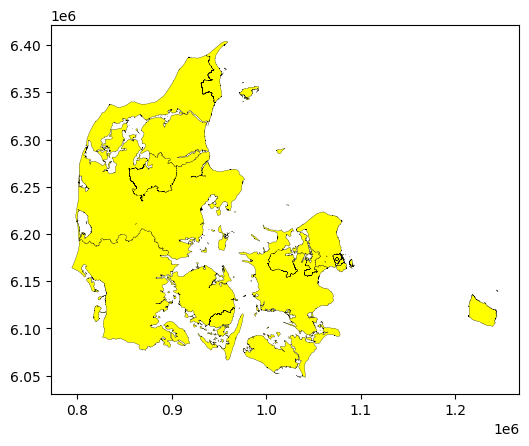

In [ ]:
denmark_municipalities.dissolve(by='parent_id').plot(facecolor='yellow', edgecolor='black',linewidth=0.2)

denmark_parentid_diss=denmark_municipalities.dissolve(by='parent_id')
denmark_parentid_diss #este es nuestro geo dataframe

# Exercise 7
1. Select some points from your maps.

In [ ]:
#denmark = countries[countries.COUNTRY=='Dinamarca']
#denmark_5596 = denmark.to_crs(5596)
denmark_4096.crs.axis_info

[Axis(name=Easting, abbrev=E, direction=east, unit_auth_code=EPSG, unit_code=9001, unit_name=metre),
 Axis(name=Northing, abbrev=N, direction=north, unit_auth_code=EPSG, unit_code=9001, unit_name=metre)]

In [ ]:
denmark_4096.centroid.x.values[0]

491579.0106276414

In [ ]:
dm_airports

,name,kind,latitude_deg,longitude_deg,elevation_ft,region_name,municipality
0,Copenhagen Kastrup Airport,large_airport,55.617901,12.656000,17.0,Capital Region,Copenhagen
1,Billund Airport,large_airport,55.740496,9.160452,247.0,South Denmark,Billund
2,Aalborg Airport,medium_airport,57.094763,9.849930,10.0,North Jutland,Aalborg
3,Aarhus Airport,medium_airport,56.303331,10.618286,82.0,Central Jutland,Aarhus
4,Copenhagen Roskilde Airport,medium_airport,55.585602,12.131400,146.0,Zealand,Copenhagen
...,...,...,...,...,...,...,...
133,Aarhus University Hospital Helipad B,heliport,56.190780,10.174920,NaN,Central Jutland,Aarhus
134,Rigshospitalet Helipad,heliport,55.696662,12.566769,NaN,Capital Region,Copenhagen
135,Holsted Helipad,heliport,55.496667,8.910833,NaN,South Denmark,Holsted
136,Korsør Helipad,heliport,55.354250,11.124300,9.0,Zealand,Korsør


2. Create the convex hull for those points.

In [ ]:
from shapely.geometry import Point

In [ ]:
# Crear la columna de geometría a partir de latitud y longitud
geometry = [Point(xy) for xy in zip(dm_airports['longitude_deg'], dm_airports['latitude_deg'])]

# Crear un GeoDataFrame
aeropuertos = gpd.GeoDataFrame(dm_airports, geometry=geometry)

# Establecer el sistema de coordenadas (CRS) a WGS84 (EPSG:4326)
aeropuertos.set_crs(epsg=4326, inplace=True)
aeropuertos

,name,kind,latitude_deg,longitude_deg,elevation_ft,region_name,municipality,geometry
0,Copenhagen Kastrup Airport,large_airport,55.617901,12.656000,17.0,Capital Region,Copenhagen,POINT (12.65600 55.61790)
1,Billund Airport,large_airport,55.740496,9.160452,247.0,South Denmark,Billund,POINT (9.16045 55.74050)
2,Aalborg Airport,medium_airport,57.094763,9.849930,10.0,North Jutland,Aalborg,POINT (9.84993 57.09476)
3,Aarhus Airport,medium_airport,56.303331,10.618286,82.0,Central Jutland,Aarhus,POINT (10.61829 56.30333)
4,Copenhagen Roskilde Airport,medium_airport,55.585602,12.131400,146.0,Zealand,Copenhagen,POINT (12.13140 55.58560)
...,...,...,...,...,...,...,...,...
133,Aarhus University Hospital Helipad B,heliport,56.190780,10.174920,NaN,Central Jutland,Aarhus,POINT (10.17492 56.19078)
134,Rigshospitalet Helipad,heliport,55.696662,12.566769,NaN,Capital Region,Copenhagen,POINT (12.56677 55.69666)
135,Holsted Helipad,heliport,55.496667,8.910833,NaN,South Denmark,Holsted,POINT (8.91083 55.49667)
136,Korsør Helipad,heliport,55.354250,11.124300,9.0,Zealand,Korsør,POINT (11.12430 55.35425)


In [ ]:
# coordinates
centroidX,centroidY = denmark_4096.centroid.x.values[0], denmark_4096.centroid.y.values[0]

# subsets of medium airports
denmark_AirTopLeft=aeropuertos[aeropuertos.kind=='medium_airport'].cx[:centroidX,centroidY:]
denmark_AirTopRight=aeropuertos[aeropuertos.kind=='medium_airport'].cx[centroidX:,centroidY:]
denmark_AirBottomLeft=aeropuertos[aeropuertos.kind=='medium_airport'].cx[:centroidX,:centroidY]
denmark_AirBottomRight=aeropuertos[aeropuertos.kind=='medium_airport'].cx[centroidX:,:centroidY]

<Axes: >

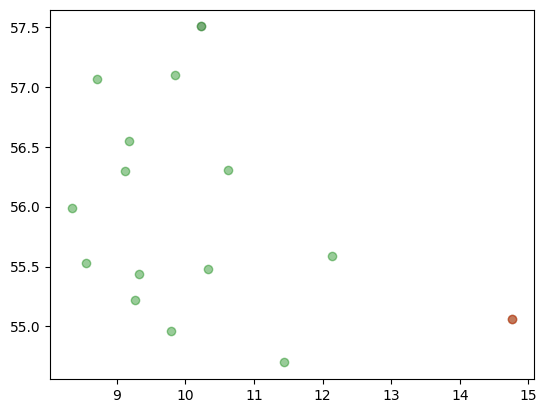

In [ ]:
base = denmark_AirTopLeft.plot(facecolor='grey', alpha=0.4)
#denmark_AirTopRight.plot(ax=base,facecolor='orange', alpha=0.4)
denmark_AirBottomLeft.plot(ax=base,facecolor='green', alpha=0.4)
denmark_AirBottomRight.plot(ax=base,facecolor='red', alpha=0.4)

3. Turn the hull into a GDF.

In [ ]:
large_airport =  aeropuertos[aeropuertos.kind=='large_airport']
LargeAirport_hull= gpd.GeoDataFrame(index=[0],
                                    crs=large_airport.crs,
                                    geometry=[large_airport.unary_union.convex_hull])
LargeAirport_hull['name']='large airports hull' # optional

# then

LargeAirport_hull

,geometry,name
0,"LINESTRING (9.16045 55.74050, 12.65600 55.61790)",large airports hull


4. Plot the hull on top of the country.

<Axes: >

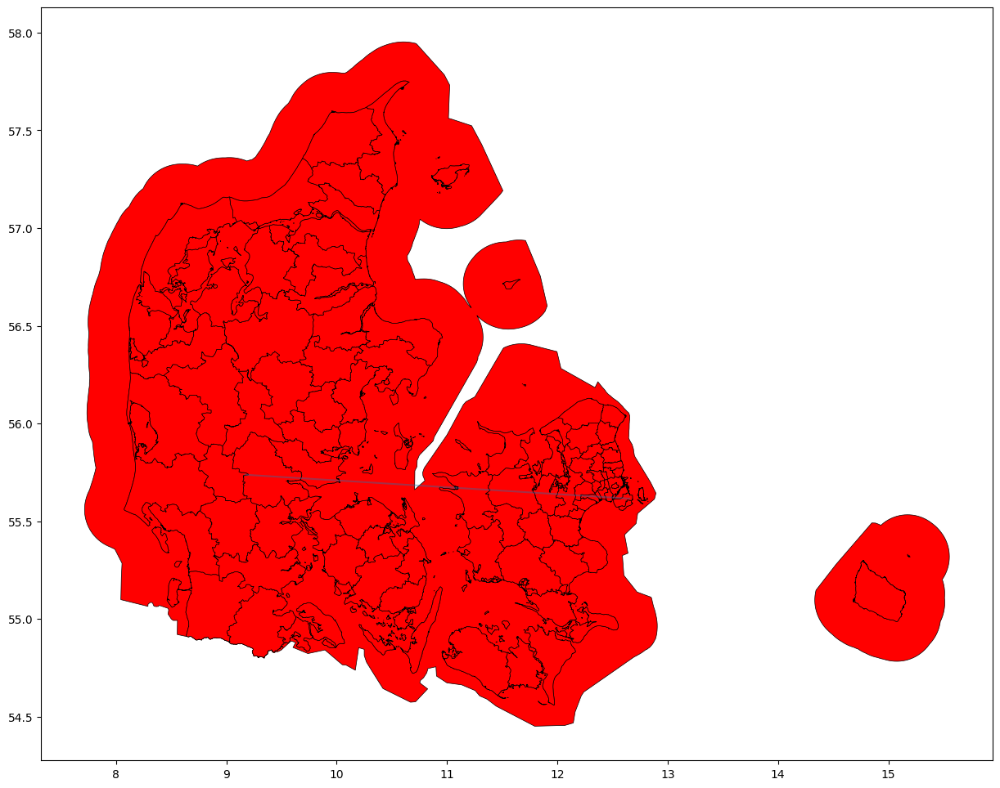

In [ ]:
base = boundaries.plot(facecolor="red", edgecolor='black', linewidth=0.5,figsize=(15,15), markersize=0.01)
LargeAirport_hull.plot(ax=base, facecolor='yellow', alpha=0.4)
#denmark_municipalities.dissolve(by='parent_id').plot(facecolor='yellow', edgecolor='black',linewidth=0.2)